Loading Data & Generating Artifacts...
Loading Run: HUV_Benchmark_Optimized (ID: 1)


### Full Logistic Regression Analysis

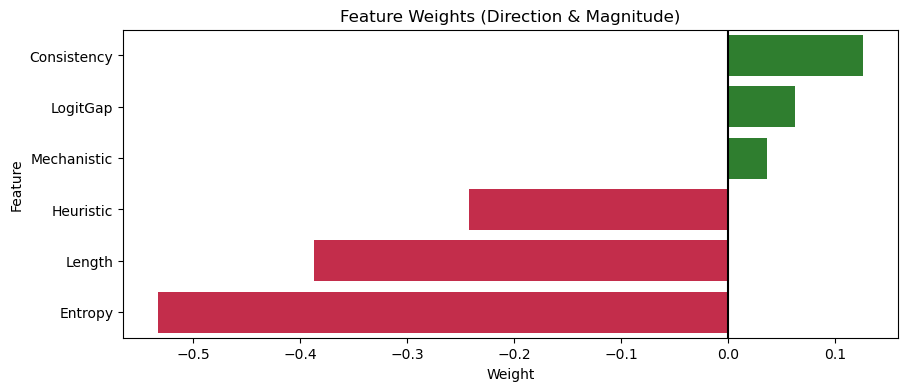

              precision    recall  f1-score   support

           0       0.42      0.58      0.49       525
           1       0.82      0.70      0.76      1411

    accuracy                           0.67      1936
   macro avg       0.62      0.64      0.62      1936
weighted avg       0.71      0.67      0.68      1936



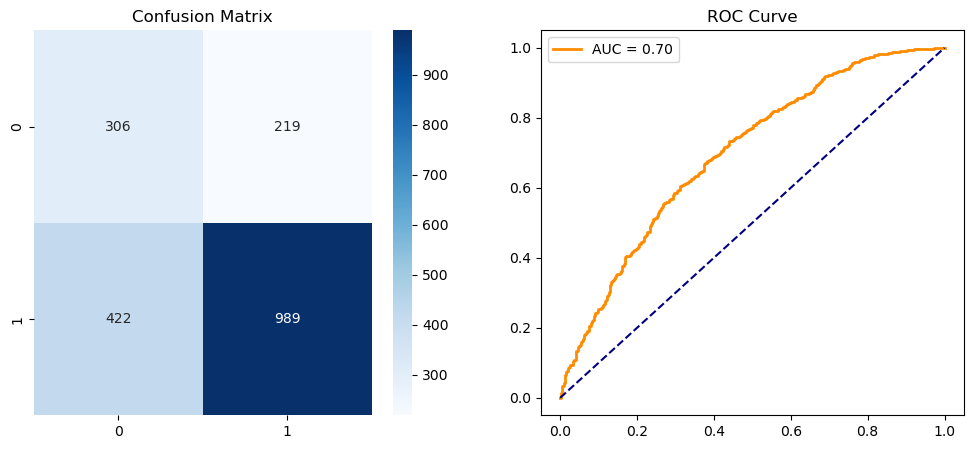

Metric,Shift (SD),Mean,SD,Vis
Entropy,-0.24 SD,0.047,0.014,
LogitGap,+0.13 SD,0.051,0.044,
Heuristic,-0.23 SD,0.437,0.022,
Mechanistic,-0.07 SD,0.965,0.005,
Consistency,-0.14 SD,0.933,0.030,
Length,+1.05 SD,348.577,47.864,
Metric,Shift (SD),Mean,SD,Vis
Entropy,+1.98 SD,0.134,0.027,
LogitGap,-0.12 SD,0.030,0.032,
Heuristic,+0.02 SD,0.447,0.035,


Generating t-SNE...


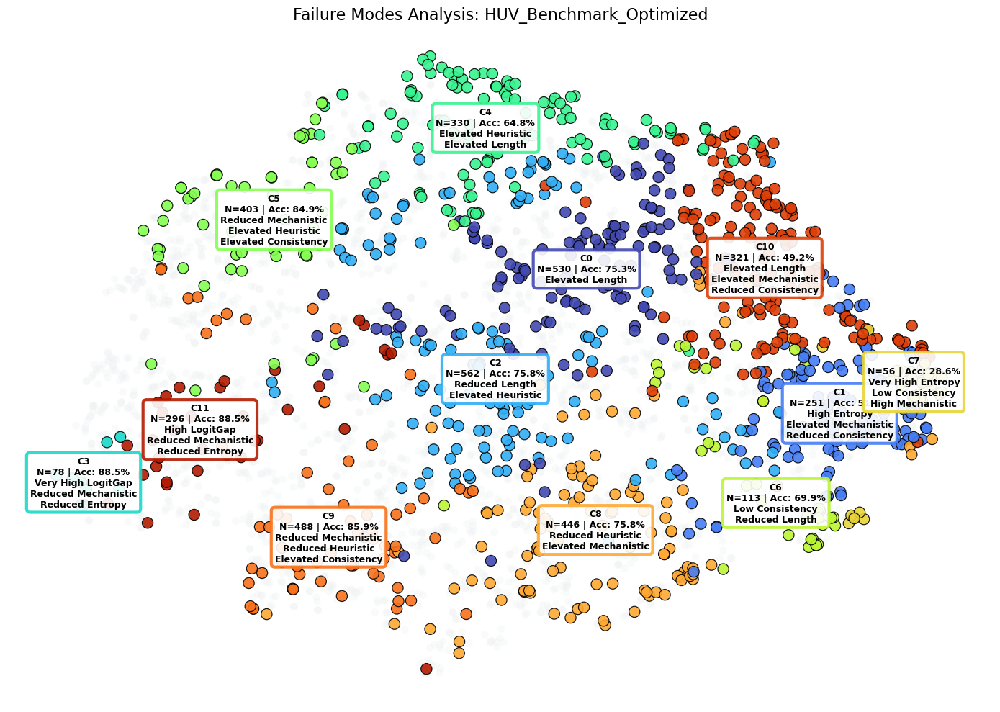

In [1]:
import analysis_utils as utils
import pandas as pd
import numpy as np
import importlib

importlib.reload(utils)
print("Loading Data & Generating Artifacts...")
df, metrics, exp_info = utils.load_data_universal("db/results.sqlite")

metrics_to_use = ['Entropy', 'LogitGap', 'Heuristic', 'Mechanistic', 'Consistency', 'Length']

logistic_predictor = utils.run_detailed_logistic_regression(df, features=metrics_to_use)

cluster_predictor = utils.run_failure_modes_dashboard(df, exp_info, features=metrics_to_use)

In [2]:
# 1. Capture Logistic Fusion Probabilities (Index 0)
df['Logistic_Fusion'], _ = logistic_predictor(df)

# 2. Capture Cluster Labels (Index 1)
_, df['Cluster_Label'] = cluster_predictor(df)

# 3. (Optional) Capture Cluster Confidence if needed
df['Cluster_Conf'], _ = cluster_predictor(df)

# Verify
print(df[['Logistic_Fusion', 'Cluster_Label']].head())

   Logistic_Fusion                                      Cluster_Label
0         0.785339  C3\nN=78 | Acc: 88.5%\nVery High LogitGap\nRed...
1         0.649619  C11\nN=296 | Acc: 88.5%\nHigh LogitGap\nReduce...
2         0.791752  C6\nN=113 | Acc: 69.9%\nLow Consistency\nReduc...
3         0.659969  C6\nN=113 | Acc: 69.9%\nLow Consistency\nReduc...
4         0.356437            C0\nN=530 | Acc: 75.3%\nElevated Length


In [3]:
utils.run_comparison_dashboard(df, logistic_predictor, cluster_predictor, metrics_to_use)

,AUROC (↑),ECE (↓),MSE (↓),Status
Model,,,,
Logistic Fusion,0.6995,0.2087,0.2170,
Cluster Baseline,0.6766,0.0000,0.1771,🏆 Winner
Entropy,0.6472,0.1152,0.1940,
LogitGap,0.4073,0.2213,0.2493,
Heuristic,0.4715,0.2437,0.2698,
Mechanistic,0.3462,0.1411,0.2207,
Consistency,0.6139,0.1637,0.2161,
Length,0.6236,0.2606,0.2570,


Model,Mn,Rg
Logistic Fusion,0.54,0.41
Cluster Baseline,0.76,0.00
Entropy,0.84,0.26
LogitGap,0.94,0.23
Heuristic,0.57,0.58
Mechanistic,0.80,0.26
Consistency,0.91,0.18
Length,0.58,0.54
Model,Mn,Rg
Logistic Fusion,0.51,0.42


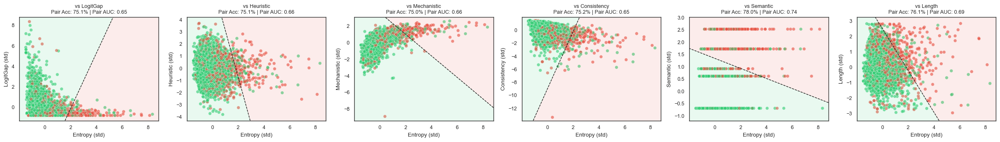

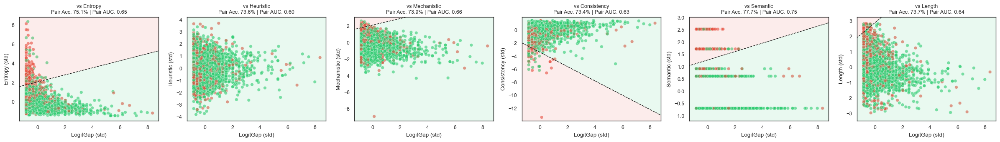

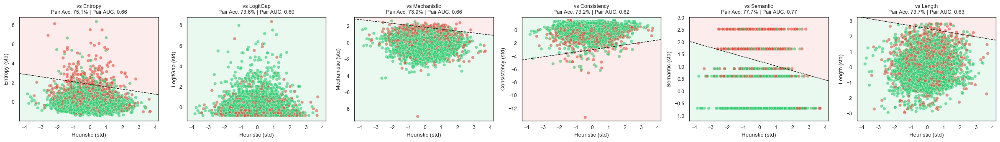

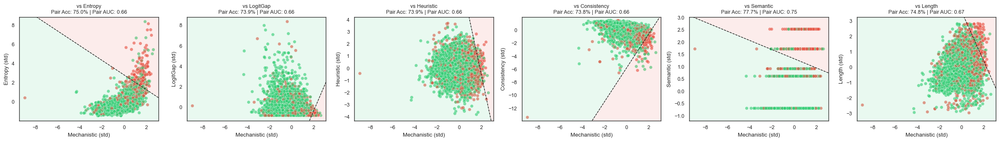

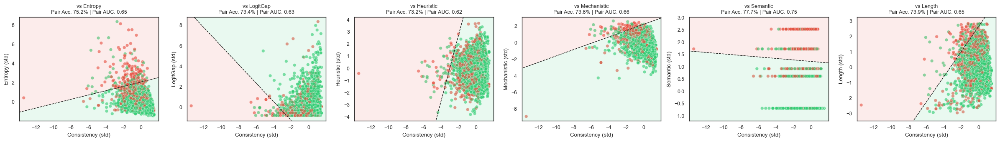

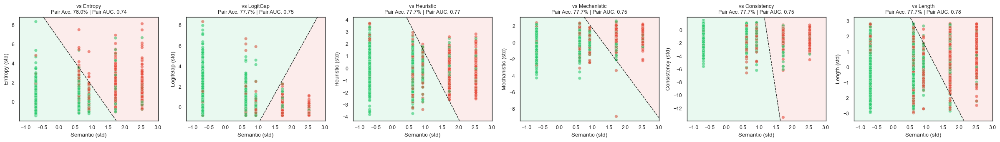

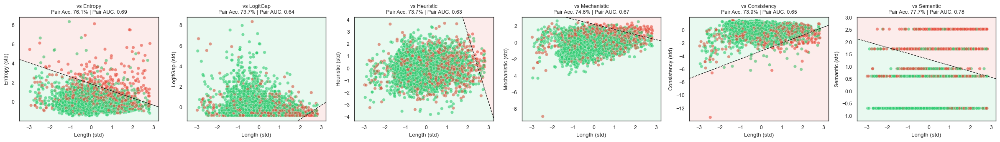

{'Entropy': <analysis_utils.PredictorArtifact at 0x33c71d210>,
 'LogitGap': <analysis_utils.PredictorArtifact at 0x118b93e90>,
 'Heuristic': <analysis_utils.PredictorArtifact at 0x361c3c9d0>,
 'Mechanistic': <analysis_utils.PredictorArtifact at 0x361e06490>,
 'Consistency': <analysis_utils.PredictorArtifact at 0x361e3b4d0>,
 'Semantic': <analysis_utils.PredictorArtifact at 0x3620373d0>,
 'Length': <analysis_utils.PredictorArtifact at 0x36221e7d0>}

In [4]:
utils.run_full_analysis(df,metrics)

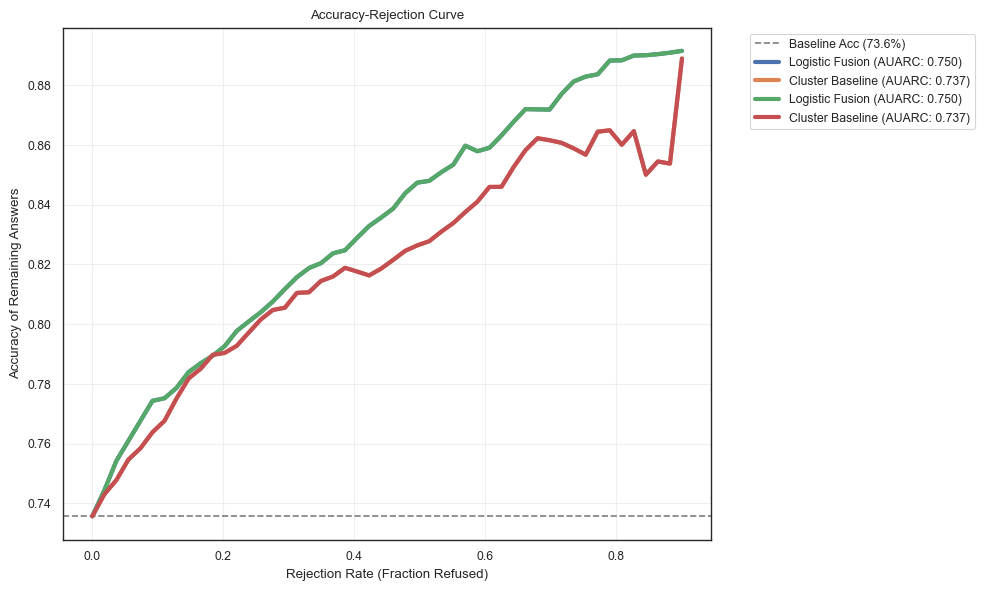

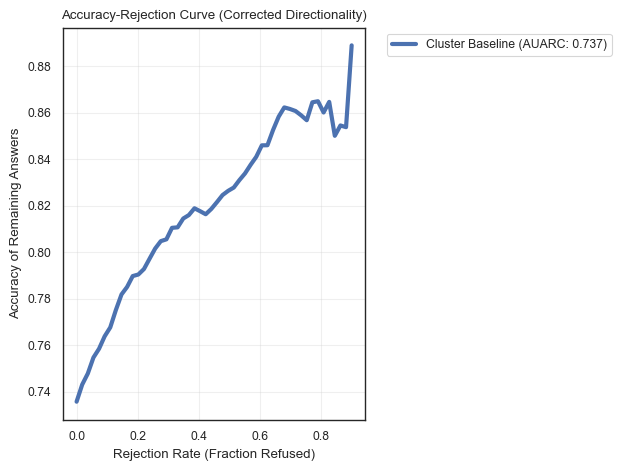

In [5]:
# 1. Convert Text Labels to Numerical Scores (Cluster Accuracy)
# This creates a baseline: "My confidence is the average accuracy of this cluster"
cluster_accs = df.groupby('Cluster_Label')['Correct'].mean()
df['Cluster Baseline'] = df['Cluster_Label'].map(cluster_accs)

df['Cluster Baseline'] = df['Cluster_Label'].map(cluster_accs)

# 2. Update the list to use the Numerical column
metrics_to_plot = ['Logistic Fusion', 'Cluster Baseline'] 

# 3. Plot
utils.plot_auarc_analysis(df, metrics_to_plot)

In [6]:
def analyze_outlier_clusters(df):
    from IPython.display import display, HTML
    import pandas as pd
    
    # --- 0. PRE-FILTERING ---
    # Filter out generations longer than 500 tokens
    initial_len = len(df)
    df = df[df['Length'] <= 500].copy()
    filtered_len = len(df)
    
    if initial_len != filtered_len:
        print(f"ℹ️ Filtered {initial_len - filtered_len} rows with Length > 500 (New Size: {filtered_len})")

    # --- CONFIGURATION ---
    # 1. Low Entropy (High Confidence) + Low Mechanistic (High Confidence)
    mask_a = (df['Entropy_Z'] < -0.5) & (df['Mechanistic_Z'] < -0.5) 
    
    # 2. High Entropy (Low Confidence) + High Mechanistic (Low Confidence)
    mask_b = (df['Entropy_Z'] > 0.5) & (df['Mechanistic_Z'] > 0.5)
    
    # 3. Define metrics to display stats for
    metrics_to_show = ['LogitGap', 'Heuristic', 'Consistency', 'Length', 'Semantic']
    
    groups = [
        ("Group A: High Confidence (Low Ent + Low Mech)", mask_a, "#27ae60"), # Green
        ("Group B: High Uncertainty (High Ent + High Mech)", mask_b, "#e74c3c")  # Red
    ]

    # --- HTML STYLING ---
    css = """
    <style>
        .out-box { border: 1px solid #ddd; border-radius: 8px; margin-bottom: 30px; overflow: hidden; font-family: 'Segoe UI', sans-serif; }
        .out-head { padding: 10px 15px; color: white; font-weight: bold; display: flex; justify-content: space-between; }
        .out-stats { padding: 15px; background: #f9f9f9; border-bottom: 1px solid #eee; display: grid; grid-template-columns: repeat(auto-fit, minmax(100px, 1fr)); gap: 10px; text-align: center; }
        .out-stat-item { background: white; padding: 8px; border-radius: 4px; border: 1px solid #eee; box-shadow: 0 1px 2px rgba(0,0,0,0.05); }
        .out-stat-val { font-weight: bold; font-size: 1.1em; color: #2c3e50; }
        .out-stat-lbl { font-size: 0.75em; color: #7f8c8d; text-transform: uppercase; letter-spacing: 0.5px; }
        .ex-row { padding: 10px 15px; border-bottom: 1px solid #eee; font-size: 0.9em; }
        .ex-meta { display: flex; gap: 10px; margin-bottom: 4px; font-size: 0.8em; color: #666; font-family: monospace; }
        .tag { padding: 2px 5px; border-radius: 3px; color: white; font-weight: bold; font-size: 0.8em;}
        .pass { background: #27ae60; } .fail { background: #c0392b; }
    </style>
    """
    display(HTML(css))

    for title, mask, color in groups:
        sub = df[mask].copy()
        n = len(sub)
        
        if n == 0:
            display(HTML(f"<div class='out-box'><div class='out-head' style='background:{color}'>{title} (N=0)</div><div style='padding:15px'>No samples found.</div></div>"))
            continue

        acc = sub['Correct'].mean()
        
        # --- 1. DYNAMIC STATISTICS ---
        stats_html = f"""
        <div class='out-stat-item'><div class='out-stat-val'>{n}</div><div class='out-stat-lbl'>Count</div></div>
        <div class='out-stat-item'><div class='out-stat-val'>{acc:.1%}</div><div class='out-stat-lbl'>Accuracy</div></div>
        """
        
        for m in metrics_to_show:
            if m in sub.columns:
                # Prioritize Z-score if available
                col = f"{m}_Z" if f"{m}_Z" in sub.columns else m
                val = sub[col].mean()
                disp_val = f"{val:.2f}"
                stats_html += f"<div class='out-stat-item'><div class='out-stat-val'>{disp_val}</div><div class='out-stat-lbl'>Avg {m}</div></div>"

        # --- 2. EXAMPLES (Top 10) ---
        examples_html = ""
        # Sort by Entropy to see extreme cases
        for i, row in sub.sort_values('Entropy_Z', ascending=False).head(10).iterrows():
            status = "<span class='tag pass'>PASS</span>" if row['Correct'] else "<span class='tag fail'>FAIL</span>"
            q_text = row.get('question_text', 'N/A')
            ans_text = str(row.get('full_trace_text', ''))[:]
            
            meta = f"Ent: {row.get('Entropy_Z', 0):.2f} | Mech: {row.get('Mechanistic_Z', 0):.2f}"
            
            examples_html += f"""
            <div class='ex-row'>
                <div class='ex-meta'>{status} {meta}</div>
                <div style='font-weight:bold; margin-bottom:2px; color:#2c3e50'>Q: {q_text}</div>
                <div style='color:#555; font-style:italic'>A: {ans_text}</div>
            </div>
            """

        # --- ASSEMBLE ---
        html = f"""
        <div class='out-box'>
            <div class='out-head' style='background:{color}'>
                <span>{title}</span>
                <span>Size: {n} ({n/len(df):.1%})</span>
            </div>
            <div class='out-stats'>{stats_html}</div>
            <div style='max-height:400px; overflow-y:auto'>{examples_html}</div>
        </div>
        """
        display(HTML(html))

# --- RUN IT ---
analyze_outlier_clusters(df)

In [7]:
def analyze_outlier_clusters(df):
    from IPython.display import display, HTML
    import pandas as pd
    
    # --- 0. PRE-FILTERING ---
    # Filter out generations longer than 500 tokens
    initial_len = len(df)
    df = df[df['Length'] <= 500].copy()
    filtered_len = len(df)
    
    if initial_len != filtered_len:
        print(f"ℹ️ Filtered {initial_len - filtered_len} rows with Length > 500 (New Size: {filtered_len})")

    # --- CONFIGURATION ---
    # 1. Low Entropy (High Confidence) + Low Mechanistic (High Confidence)
    mask_a = (df['Entropy_Z'] < -0.5) & (df['Mechanistic_Z'] < -0.5) 
    
    # 2. High Entropy (Low Confidence) + High Mechanistic (Low Confidence)
    mask_b = (df['Entropy_Z'] > 0.5) & (df['Mechanistic_Z'] > 0.5)
    
    # 3. Define metrics to display stats for
    metrics_to_show = ['LogitGap', 'Heuristic', 'Consistency', 'Length', 'Semantic']
    
    groups = [
        ("Group A: High Confidence (Low Ent + Low Mech)", mask_a, "#27ae60"), # Green
        ("Group B: High Uncertainty (High Ent + High Mech)", mask_b, "#e74c3c")  # Red
    ]

    # --- HTML STYLING ---
    css = """
    <style>
        .out-box { border: 1px solid #ddd; border-radius: 8px; margin-bottom: 30px; overflow: hidden; font-family: 'Segoe UI', sans-serif; }
        .out-head { padding: 10px 15px; color: white; font-weight: bold; display: flex; justify-content: space-between; }
        .out-stats { padding: 15px; background: #f9f9f9; border-bottom: 1px solid #eee; display: grid; grid-template-columns: repeat(auto-fit, minmax(100px, 1fr)); gap: 10px; text-align: center; }
        .out-stat-item { background: white; padding: 8px; border-radius: 4px; border: 1px solid #eee; box-shadow: 0 1px 2px rgba(0,0,0,0.05); }
        .out-stat-val { font-weight: bold; font-size: 1.1em; color: #2c3e50; }
        .out-stat-lbl { font-size: 0.75em; color: #7f8c8d; text-transform: uppercase; letter-spacing: 0.5px; }
        .ex-row { padding: 10px 15px; border-bottom: 1px solid #eee; font-size: 0.9em; }
        .ex-meta { display: flex; gap: 10px; margin-bottom: 4px; font-size: 0.8em; color: #666; font-family: monospace; }
        .tag { padding: 2px 5px; border-radius: 3px; color: white; font-weight: bold; font-size: 0.8em;}
        .pass { background: #27ae60; } .fail { background: #c0392b; }
    </style>
    """
    display(HTML(css))

    for title, mask, color in groups:
        sub = df[mask].copy()
        n = len(sub)
        
        if n == 0:
            display(HTML(f"<div class='out-box'><div class='out-head' style='background:{color}'>{title} (N=0)</div><div style='padding:15px'>No samples found.</div></div>"))
            continue

        acc = sub['Correct'].mean()
        
        # --- 1. DYNAMIC STATISTICS ---
        stats_html = f"""
        <div class='out-stat-item'><div class='out-stat-val'>{n}</div><div class='out-stat-lbl'>Count</div></div>
        <div class='out-stat-item'><div class='out-stat-val'>{acc:.1%}</div><div class='out-stat-lbl'>Accuracy</div></div>
        """
        
        for m in metrics_to_show:
            if m in sub.columns:
                # Prioritize Z-score if available
                col = f"{m}_Z" if f"{m}_Z" in sub.columns else m
                val = sub[col].mean()
                disp_val = f"{val:.2f}"
                stats_html += f"<div class='out-stat-item'><div class='out-stat-val'>{disp_val}</div><div class='out-stat-lbl'>Avg {m}</div></div>"

        # --- 2. EXAMPLES (Top 10) ---
        examples_html = ""
        # Sort by Entropy to see extreme cases
        for i, row in sub.sort_values('Entropy_Z', ascending=False).head(10).iterrows():
            status = "<span class='tag pass'>PASS</span>" if row['Correct'] else "<span class='tag fail'>FAIL</span>"
            q_text = row.get('question_text', 'N/A')
            ans_text = str(row.get('full_trace_text', ''))[:]
            
            meta = f"Ent: {row.get('Entropy_Z', 0):.2f} | Mech: {row.get('Mechanistic_Z', 0):.2f}"
            
            examples_html += f"""
            <div class='ex-row'>
                <div class='ex-meta'>{status} {meta}</div>
                <div style='font-weight:bold; margin-bottom:2px; color:#2c3e50'>Q: {q_text}</div>
                <div style='color:#555; font-style:italic'>A: {ans_text}</div>
            </div>
            """

        # --- ASSEMBLE ---
        html = f"""
        <div class='out-box'>
            <div class='out-head' style='background:{color}'>
                <span>{title}</span>
                <span>Size: {n} ({n/len(df):.1%})</span>
            </div>
            <div class='out-stats'>{stats_html}</div>
            <div style='max-height:400px; overflow-y:auto'>{examples_html}</div>
        </div>
        """
        display(HTML(html))

# --- RUN IT ---
analyze_outlier_clusters(df)

Re-clustering using subset: ['Entropy', 'LogitGap', 'Heuristic', 'Mechanistic']...
Identified 12 clusters. Safety Scores (Accuracy) range: 26.7% - 89.8%
Analyzing 986 questions with multiple answers...


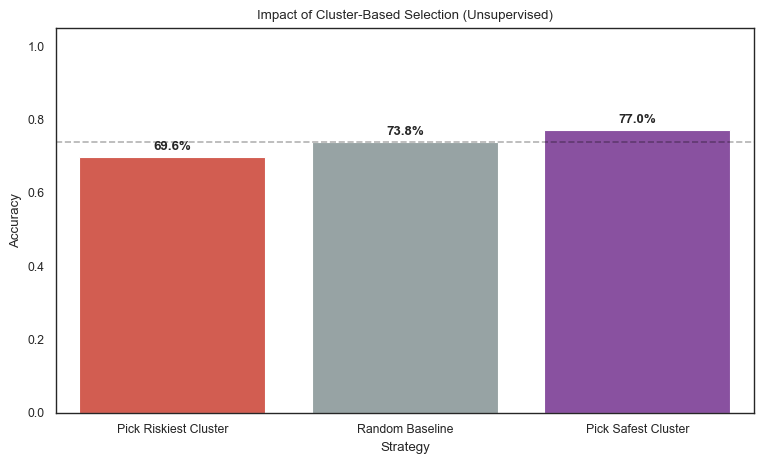

In [12]:
def analyze_intra_question_cluster_subset(df):
    from sklearn.cluster import KMeans
    from sklearn.preprocessing import StandardScaler
    import seaborn as sns
    import matplotlib.pyplot as plt
    import pandas as pd
    import numpy as np
    from IPython.display import display, HTML

    # --- 1. RE-CLUSTER (Subset Features Only) ---
    subset_features = ['Entropy', 'LogitGap', 'Heuristic', 'Mechanistic']
    print(f"Re-clustering using subset: {subset_features}...")
    
    # Prepare Data
    X = df[subset_features].fillna(0)
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Adaptive K (same logic as dashboard)
    n_clusters = min(12, len(df)//10) if len(df) > 50 else 3
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_scaled)
    
    # --- 2. CALCULATE CLUSTER "SAFETY" SCORES ---
    df['Temp_Cluster'] = labels
    cluster_accs = df.groupby('Temp_Cluster')['Correct'].mean()
    
    # Map the cluster's accuracy to the individual sample
    # This becomes our "Probability of Correctness" proxy
    prob_col = 'Cluster_Safety_Score'
    df[prob_col] = df['Temp_Cluster'].map(cluster_accs)
    
    print(f"Identified {n_clusters} clusters. Safety Scores (Accuracy) range: {cluster_accs.min():.1%} - {cluster_accs.max():.1%}")

    # --- 3. INTRA-QUESTION ANALYSIS ---
    group_col = 'question_id_external' if 'question_id_external' in df.columns else 'question_text'
    grouped = df.groupby(group_col)
    multi_sample_mask = grouped[prob_col].transform('count') > 1
    sub_df = df[multi_sample_mask].copy()
    
    if len(sub_df) == 0:
        print("⚠️ Not enough data: No questions have multiple answers.")
        return

    print(f"Analyzing {len(sub_df[group_col].unique())} questions with multiple answers...")

    results = []
    
    for q_id, group in sub_df.groupby(group_col):
        if len(group) < 2: continue
        
        # Find index of Safest (Best Cluster) and Riskiest (Worst Cluster) answers
        id_best = group[prob_col].idxmax()
        id_worst = group[prob_col].idxmin()
        
        # Skip if all answers fall into clusters with identical accuracy
        if group.loc[id_best, prob_col] == group.loc[id_worst, prob_col]:
            continue

        results.append({
            'Question': q_id,
            'Selected_Best_Correct': group.loc[id_best, 'Correct'],   # Picked the safest cluster?
            'Selected_Worst_Correct': group.loc[id_worst, 'Correct'], # Picked the riskiest cluster?
            'Random_Baseline': group['Correct'].mean(),
            'Safety_Spread': group.loc[id_best, prob_col] - group.loc[id_worst, prob_col]
        })

    if not results:
        print("⚠️ Clusters did not differentiate answers within groups.")
        return

    res_df = pd.DataFrame(results)

    # --- 4. CALCULATE & VISUALIZE ---
    acc_best = res_df['Selected_Best_Correct'].mean()
    acc_worst = res_df['Selected_Worst_Correct'].mean()
    acc_base = res_df['Random_Baseline'].mean()
    
    # HTML Summary
    delta = acc_best - acc_base
    color = "#27ae60" if delta > 0 else "#c0392b"
    
    html = f"""
    <div style='border:1px solid #ddd; padding:15px; border-radius:8px; margin-bottom:20px; background:white'>
        <h3 style='margin-top:0; color:#2c3e50'>Cluster-Based Selection Strategy</h3>
        <div style='font-size:0.9em; color:#666; margin-bottom:10px'>
            Strategy: Pick answer belonging to the cluster with highest historical accuracy.<br>
            (Re-clustered on single-sample metrics only)
        </div>
        
        <div style='display:flex; gap:20px; align-items:flex-end'>
            <div style='text-align:center'>
                <div style='font-size:2em; font-weight:bold; color:#7f8c8d'>{acc_base:.1%}</div>
                <div style='color:#7f8c8d; font-size:0.8em'>Random Baseline</div>
            </div>
            <div style='font-size:2em; color:#ccc'>→</div>
            <div style='text-align:center'>
                <div style='font-size:2em; font-weight:bold; color:#8e44ad'>{acc_best:.1%}</div>
                <div style='color:#8e44ad; font-weight:bold; font-size:0.8em'>Best Cluster</div>
            </div>
            <div style='font-size:2em; color:#ccc'>vs</div>
            <div style='text-align:center'>
                <div style='font-size:2em; font-weight:bold; color:#c0392b'>{acc_worst:.1%}</div>
                <div style='color:#c0392b; font-size:0.8em'>Worst Cluster</div>
            </div>
        </div>
        <div style='margin-top:10px; font-weight:bold; color:{color}; font-size:1.1em'>
            Gain: {delta:+.1%} accuracy
        </div>
    </div>
    """
    display(HTML(html))

    # Plot
    plt.figure(figsize=(9, 5))
    plot_data = pd.DataFrame({
        'Strategy': ['Pick Riskiest Cluster', 'Random Baseline', 'Pick Safest Cluster'],
        'Accuracy': [acc_worst, acc_base, acc_best]
    })
    
    ax = sns.barplot(x='Strategy', y='Accuracy', data=plot_data, palette=['#e74c3c', '#95a5a6', '#8e44ad'])
    plt.ylim(0, 1.05)
    plt.axhline(acc_base, color='black', linestyle='--', alpha=0.3, label='Baseline')
    
    for i, v in enumerate(plot_data['Accuracy']):
        ax.text(i, v + 0.02, f"{v:.1%}", ha='center', fontweight='bold')
        
    plt.title("Impact of Cluster-Based Selection (Unsupervised)")
    plt.ylabel("Accuracy")
    plt.show()

# --- RUN IT ---
analyze_intra_question_cluster_subset(df)

🔍 Analyzing all 31 feature subsets...


,Feature,Impact,Verdict
4,Length,-0.72%,TOSS
2,Heuristic,-0.59%,TOSS
1,LogitGap,-0.39%,TOSS
3,Mechanistic,2.20%,KEEP
0,Entropy,4.20%,KEEP


,Size,Features,Acc_Best,Acc_Worst,Gap
0,2,"Entropy, Heuristic",76.3%,68.8%,7.5%
1,3,"Entropy, Heuristic, Mechanistic",76.5%,69.1%,7.4%
2,1,Entropy,76.2%,68.9%,7.3%
3,4,"Entropy, LogitGap, Mechanistic, Length",75.2%,68.0%,7.2%
4,2,"Entropy, Mechanistic",76.5%,69.4%,7.1%


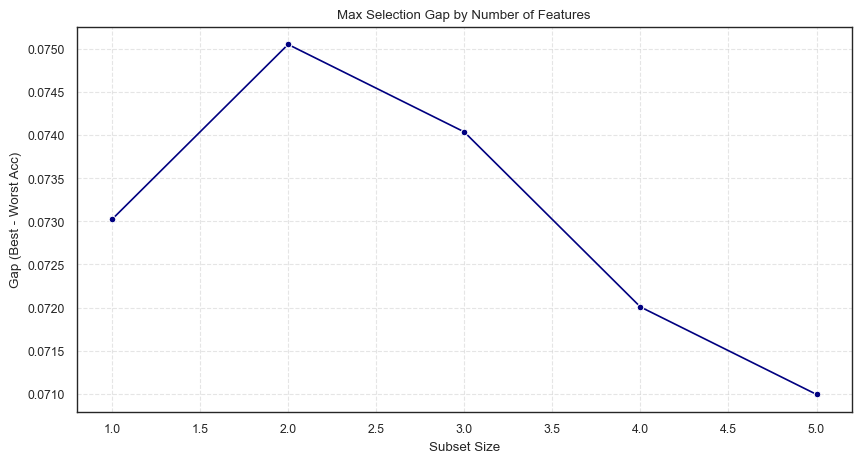

In [13]:
def analyze_feature_redundancy(df):
    import itertools
    import pandas as pd
    import seaborn as sns
    import matplotlib.pyplot as plt
    from sklearn.linear_model import LogisticRegression
    from sklearn.preprocessing import StandardScaler
    from IPython.display import display, HTML
    
    # 1. Setup
    features = ['Entropy', 'LogitGap', 'Heuristic', 'Mechanistic', 'Length']
    results = []
    
    print(f"🔍 Analyzing all {2**len(features) - 1} feature subsets...")
    
    # Pre-scale to speed up the loop
    X_raw = df[features].fillna(0)
    scaler = StandardScaler()
    X_scaled = pd.DataFrame(scaler.fit_transform(X_raw), columns=features, index=df.index)
    y = df['Correct']
    
    # Pre-filter for evaluation (Questions with multiple answers)
    group_col = 'question_id_external' if 'question_id_external' in df.columns else 'question_text'
    grouped = df.groupby(group_col)
    eval_mask = grouped[group_col].transform('count') > 1
    eval_df_base = df.loc[eval_mask, [group_col, 'Correct']].copy()
    
    if len(eval_df_base) == 0:
        print("⚠️ No multi-answer questions found to analyze.")
        return

    # 2. Brute-Force Search
    for r in range(1, len(features) + 1):
        for subset in itertools.combinations(features, r):
            cols = list(subset)
            
            # Train Fusion Model
            clf = LogisticRegression(class_weight='balanced', random_state=42)
            clf.fit(X_scaled[cols], y)
            
            # Predict
            probs = clf.predict_proba(X_scaled[cols])[:, 1]
            prob_series = pd.Series(probs, index=df.index)
            
            # Evaluate Selection Gap
            current_eval = eval_df_base.copy()
            current_eval['probs'] = prob_series[eval_mask]
            
            # Find best/worst per question
            g = current_eval.groupby(group_col)['probs']
            best_idx = g.idxmax()
            worst_idx = g.idxmin()
            
            # Only count questions where model actually distinguishes (Prob Best != Prob Worst)
            distinct_mask = current_eval.loc[best_idx, 'probs'].values != current_eval.loc[worst_idx, 'probs'].values
            
            valid_best = best_idx[distinct_mask]
            valid_worst = worst_idx[distinct_mask]
            
            if len(valid_best) > 0:
                acc_best = current_eval.loc[valid_best, 'Correct'].mean()
                acc_worst = current_eval.loc[valid_worst, 'Correct'].mean()
                gap = acc_best - acc_worst
                
                results.append({
                    'Size': len(cols),
                    'Features': ", ".join(cols),
                    'Acc_Best': acc_best,
                    'Acc_Worst': acc_worst,
                    'Gap': gap
                })

    # 3. Process Results
    res_df = pd.DataFrame(results).sort_values('Gap', ascending=False).reset_index(drop=True)
    
    # 4. Dispensability Analysis (Impact Score)
    # How much does the Gap drop when we REMOVE this feature?
    feature_impact = []
    for f in features:
        # Average Gap of subsets WITH feature f
        with_f = res_df[res_df['Features'].str.contains(f)]['Gap'].mean()
        # Average Gap of subsets WITHOUT feature f
        without_f = res_df[~res_df['Features'].str.contains(f)]['Gap'].mean()
        
        impact = with_f - without_f
        feature_impact.append({
            'Feature': f, 
            'Impact': impact,
            'Verdict': 'KEEP' if impact > 0.02 else ('BORDERLINE' if impact > 0 else 'TOSS')
        })
    
    impact_df = pd.DataFrame(feature_impact).sort_values('Impact', ascending=True)

    # --- DISPLAYS ---
    
    # A. Variable Impact Table
    html_impact = "<h3>🗑️ Variable Dispensability (Sorted by 'Freest to Throw Out')</h3>"
    html_impact += "<p><i>Low or Negative Impact = Removing this variable doesn't hurt (or helps).</i></p>"
    html_impact += impact_df.style.bar(subset=['Impact'], align='mid', color=['#e74c3c', '#27ae60'])\
        .format("{:.2%}", subset=['Impact'])\
        .to_html()
    display(HTML(html_impact))
    
    # B. Top Subsets Table
    html_top = "<h3>🏆 Top 5 Feature Combinations</h3>"
    html_top += res_df.head(5).style.background_gradient(subset=['Gap'], cmap='Greens')\
        .format("{:.1%}", subset=['Acc_Best', 'Acc_Worst', 'Gap'])\
        .to_html()
    display(HTML(html_top))

    # C. Complexity vs Performance Plot
    plt.figure(figsize=(10, 5))
    sns.lineplot(data=res_df, x='Size', y='Gap', marker='o', color='navy', estimator=np.max, errorbar=None)
    plt.title("Max Selection Gap by Number of Features")
    plt.ylabel("Gap (Best - Worst Acc)")
    plt.xlabel("Subset Size")
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.show()

# --- EXECUTE ---
analyze_feature_redundancy(df)

Re-clustering using subset: ['Entropy', 'LogitGap', 'Mechanistic']...
Identified 12 clusters. Safety Scores (Accuracy) range: 33.3% - 90.4%
Analyzing 986 questions with multiple answers...


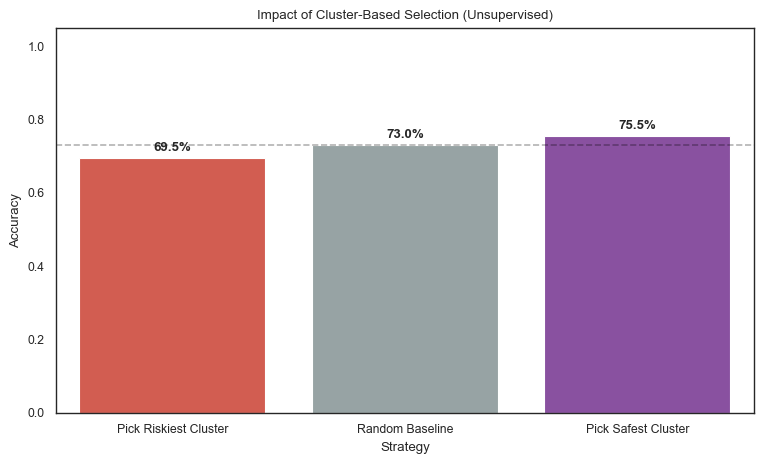

In [14]:
def analyze_intra_question_cluster_subset(df):
    from sklearn.cluster import KMeans
    from sklearn.preprocessing import StandardScaler
    import seaborn as sns
    import matplotlib.pyplot as plt
    import pandas as pd
    import numpy as np
    from IPython.display import display, HTML

    # --- 1. RE-CLUSTER (Subset Features Only) ---
    subset_features = ['Entropy', 'LogitGap', 'Mechanistic']
    print(f"Re-clustering using subset: {subset_features}...")
    
    # Prepare Data
    X = df[subset_features].fillna(0)
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Adaptive K (same logic as dashboard)
    n_clusters = min(12, len(df)//10) if len(df) > 50 else 3
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_scaled)
    
    # --- 2. CALCULATE CLUSTER "SAFETY" SCORES ---
    df['Temp_Cluster'] = labels
    cluster_accs = df.groupby('Temp_Cluster')['Correct'].mean()
    
    # Map the cluster's accuracy to the individual sample
    # This becomes our "Probability of Correctness" proxy
    prob_col = 'Cluster_Safety_Score'
    df[prob_col] = df['Temp_Cluster'].map(cluster_accs)
    
    print(f"Identified {n_clusters} clusters. Safety Scores (Accuracy) range: {cluster_accs.min():.1%} - {cluster_accs.max():.1%}")

    # --- 3. INTRA-QUESTION ANALYSIS ---
    group_col = 'question_id_external' if 'question_id_external' in df.columns else 'question_text'
    grouped = df.groupby(group_col)
    multi_sample_mask = grouped[prob_col].transform('count') > 1
    sub_df = df[multi_sample_mask].copy()
    
    if len(sub_df) == 0:
        print("⚠️ Not enough data: No questions have multiple answers.")
        return

    print(f"Analyzing {len(sub_df[group_col].unique())} questions with multiple answers...")

    results = []
    
    for q_id, group in sub_df.groupby(group_col):
        if len(group) < 2: continue
        
        # Find index of Safest (Best Cluster) and Riskiest (Worst Cluster) answers
        id_best = group[prob_col].idxmax()
        id_worst = group[prob_col].idxmin()
        
        # Skip if all answers fall into clusters with identical accuracy
        if group.loc[id_best, prob_col] == group.loc[id_worst, prob_col]:
            continue

        results.append({
            'Question': q_id,
            'Selected_Best_Correct': group.loc[id_best, 'Correct'],   # Picked the safest cluster?
            'Selected_Worst_Correct': group.loc[id_worst, 'Correct'], # Picked the riskiest cluster?
            'Random_Baseline': group['Correct'].mean(),
            'Safety_Spread': group.loc[id_best, prob_col] - group.loc[id_worst, prob_col]
        })

    if not results:
        print("⚠️ Clusters did not differentiate answers within groups.")
        return

    res_df = pd.DataFrame(results)

    # --- 4. CALCULATE & VISUALIZE ---
    acc_best = res_df['Selected_Best_Correct'].mean()
    acc_worst = res_df['Selected_Worst_Correct'].mean()
    acc_base = res_df['Random_Baseline'].mean()
    
    # HTML Summary
    delta = acc_best - acc_base
    color = "#27ae60" if delta > 0 else "#c0392b"
    
    html = f"""
    <div style='border:1px solid #ddd; padding:15px; border-radius:8px; margin-bottom:20px; background:white'>
        <h3 style='margin-top:0; color:#2c3e50'>Cluster-Based Selection Strategy</h3>
        <div style='font-size:0.9em; color:#666; margin-bottom:10px'>
            Strategy: Pick answer belonging to the cluster with highest historical accuracy.<br>
            (Re-clustered on single-sample metrics only)
        </div>
        
        <div style='display:flex; gap:20px; align-items:flex-end'>
            <div style='text-align:center'>
                <div style='font-size:2em; font-weight:bold; color:#7f8c8d'>{acc_base:.1%}</div>
                <div style='color:#7f8c8d; font-size:0.8em'>Random Baseline</div>
            </div>
            <div style='font-size:2em; color:#ccc'>→</div>
            <div style='text-align:center'>
                <div style='font-size:2em; font-weight:bold; color:#8e44ad'>{acc_best:.1%}</div>
                <div style='color:#8e44ad; font-weight:bold; font-size:0.8em'>Best Cluster</div>
            </div>
            <div style='font-size:2em; color:#ccc'>vs</div>
            <div style='text-align:center'>
                <div style='font-size:2em; font-weight:bold; color:#c0392b'>{acc_worst:.1%}</div>
                <div style='color:#c0392b; font-size:0.8em'>Worst Cluster</div>
            </div>
        </div>
        <div style='margin-top:10px; font-weight:bold; color:{color}; font-size:1.1em'>
            Gain: {delta:+.1%} accuracy
        </div>
    </div>
    """
    display(HTML(html))

    # Plot
    plt.figure(figsize=(9, 5))
    plot_data = pd.DataFrame({
        'Strategy': ['Pick Riskiest Cluster', 'Random Baseline', 'Pick Safest Cluster'],
        'Accuracy': [acc_worst, acc_base, acc_best]
    })
    
    ax = sns.barplot(x='Strategy', y='Accuracy', data=plot_data, palette=['#e74c3c', '#95a5a6', '#8e44ad'])
    plt.ylim(0, 1.05)
    plt.axhline(acc_base, color='black', linestyle='--', alpha=0.3, label='Baseline')
    
    for i, v in enumerate(plot_data['Accuracy']):
        ax.text(i, v + 0.02, f"{v:.1%}", ha='center', fontweight='bold')
        
    plt.title("Impact of Cluster-Based Selection (Unsupervised)")
    plt.ylabel("Accuracy")
    plt.show()

# --- RUN IT ---
analyze_intra_question_cluster_subset(df)

Re-clustering using subset: ['Entropy', 'LogitGap', 'Mechanistic']...
Analyzing 986 questions with multiple answers...


Question,Safest_Ans,Safest_Cluster_Acc,Riskiest_Ans,Riskiest_Cluster_Acc
"Janice can type 6 sentences per minute. Today at work, Janice continued working on a paper she started typing yesterday. She typed for 20 minutes, took a break, and typed 15 minutes longer. She then had to erase 40 sentences she had typed incorrectly. After a meeting, she typed for 18 minutes more. In all, the paper had 536 sentences by the end of today. How many sentences did she start with today?",258,70.5%,814,36.2%
"During one day, there are 4 boat trips through the lake. The boat can take up to 12 people during one trip. How many people can the boat transport in 2 days?",96,90.4%,2,77.2%
"In a conference room, 40 chairs with a capacity of 2 people each were arranged in rows in preparation for the board meeting of a company, whose number of members was the same as the chairs' capacity. If 2/5 of the chairs were not occupied, and the rest each had two people, calculate the number of board members who did attend the meeting.",48,72.6%,24,70.5%
"A couple with two children, ages 6 and 10 years old, decided to go to an amusement park. The regular ticket costs $109, but children below 12 years old have a $5 discount. If they gave the cashier $500, how much change will they receive?",74,72.6%,292,36.2%
Larry spends half an hour twice a day walking and playing with his dog. He also spends a fifth of an hour every day feeding his dog. How many minutes does Larry spend on his dog each day?,72,77.2%,42,72.6%


Question,Safest_Ans (Wrong),Safest_Cluster_Acc,Riskiest_Ans (Correct),Riskiest_Cluster_Acc
"Jeanette is practicing her juggling. Each week she can juggle 2 more objects than the week before. If she starts out juggling 3 objects and practices for 5 weeks, how many objects can she juggle?",35,84.2%,13,77.2%
John throws a block party and splits the cost with 3 other people. They buy 100 pounds of burgers at $3 per pound. They also buy $80 of condiments and propane to cook everything. John also buys all the alcohol which costs $200. How much did John spend altogether,145,72.6%,295,36.2%
The town’s annual budget totals $32 million. If half of the budget goes towards policing and $12 million goes towards education. How much money is left for managing public spaces?,0,90.4%,4,36.2%
"Manex is a tour bus driver. He has to drive 55 miles to the destination and drive going back to the starting point on a different way that is 10 miles farther. If he can drive 1 mile for 2 minutes and stayed 2 hours at the destination, how long will it take the bus driver to do the entire tour in hours?",62,70.5%,6,55.2%
"Silvia’s bakery is offering 10% on advanced orders over $50.00. She orders 2 quiches for $15.00 each, 6 croissants at $3.00 each and 6 buttermilk biscuits for $2.00 each. How much will her order be with the discount?",60,83.5%,54,55.2%


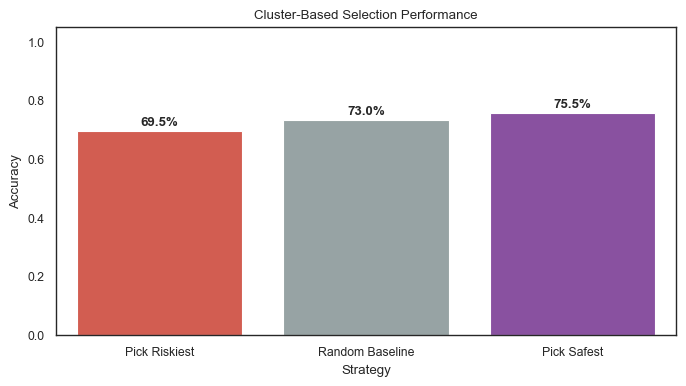

In [15]:
def analyze_intra_question_cluster_subset_with_examples(df):
    from sklearn.cluster import KMeans
    from sklearn.preprocessing import StandardScaler
    import seaborn as sns
    import matplotlib.pyplot as plt
    import pandas as pd
    import numpy as np
    from IPython.display import display, HTML

    # --- 1. RE-CLUSTER (Subset Features Only) ---
    subset_features = ['Entropy', 'LogitGap', 'Mechanistic']
    print(f"Re-clustering using subset: {subset_features}...")
    
    # Prepare Data
    X = df[subset_features].fillna(0)
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Adaptive K
    n_clusters = min(12, len(df)//10) if len(df) > 50 else 3
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_scaled)
    
    # --- 2. CALCULATE CLUSTER "SAFETY" SCORES ---
    df['Temp_Cluster'] = labels
    cluster_accs = df.groupby('Temp_Cluster')['Correct'].mean()
    
    # Map the cluster's accuracy to the individual sample
    prob_col = 'Cluster_Safety_Score'
    df[prob_col] = df['Temp_Cluster'].map(cluster_accs)
    
    # --- 3. INTRA-QUESTION ANALYSIS ---
    group_col = 'question_id_external' if 'question_id_external' in df.columns else 'question_text'
    grouped = df.groupby(group_col)
    multi_sample_mask = grouped[prob_col].transform('count') > 1
    sub_df = df[multi_sample_mask].copy()
    
    if len(sub_df) == 0:
        print("⚠️ Not enough data: No questions have multiple answers.")
        return

    wins = []       # Safest was Correct, Riskiest was Wrong
    losses = []     # Safest was Wrong, Riskiest was Correct
    results = []    # Aggregate stats
    
    print(f"Analyzing {len(sub_df[group_col].unique())} questions with multiple answers...")

    for q_id, group in sub_df.groupby(group_col):
        if len(group) < 2: continue
        
        # Find index of Safest (Best Cluster) and Riskiest (Worst Cluster) answers
        id_best = group[prob_col].idxmax()
        id_worst = group[prob_col].idxmin()
        
        # Get accuracy values
        best_is_correct = group.loc[id_best, 'Correct']
        worst_is_correct = group.loc[id_worst, 'Correct']
        
        # Skip if the metric didn't distinguish (e.g. both answers fell into the same cluster)
        if group.loc[id_best, prob_col] == group.loc[id_worst, prob_col]:
            continue

        # Track Wins/Losses
        q_text = group.iloc[0]['question_text']
        
        # CASE 1: IMPROVEMENT (The mechanism worked)
        # We picked a Correct answer because it was in a "Safe" cluster,
        # avoiding an Incorrect answer that was in a "Risky" cluster.
        if best_is_correct == 1 and worst_is_correct == 0:
            wins.append({
                'Question': q_text,
                'Safest_Ans': group.loc[id_best, 'predicted_answer'],
                'Safest_Cluster_Acc': f"{group.loc[id_best, prob_col]:.1%}",
                'Riskiest_Ans': group.loc[id_worst, 'predicted_answer'],
                'Riskiest_Cluster_Acc': f"{group.loc[id_worst, prob_col]:.1%}",
            })
            
        # CASE 2: REGRESSION (The mechanism failed)
        # We picked an Incorrect answer because it looked "Safe" (low entropy, etc),
        # but the actually Correct answer looked "Risky" (high entropy, etc).
        elif best_is_correct == 0 and worst_is_correct == 1:
            losses.append({
                'Question': q_text,
                'Safest_Ans (Wrong)': group.loc[id_best, 'predicted_answer'],
                'Safest_Cluster_Acc': f"{group.loc[id_best, prob_col]:.1%}",
                'Riskiest_Ans (Correct)': group.loc[id_worst, 'predicted_answer'],
                'Riskiest_Cluster_Acc': f"{group.loc[id_worst, prob_col]:.1%}",
            })

        results.append({
            'Selected_Best_Correct': best_is_correct,
            'Selected_Worst_Correct': worst_is_correct,
            'Random_Baseline': group['Correct'].mean()
        })

    # --- 4. PRINT EXAMPLES ---
    
    def render_examples(title, data, color):
        if not data: return
        ex_df = pd.DataFrame(data)
        # Show top 5
        display(HTML(f"<h4 style='color:{color}'>{title} ({len(data)} instances)</h4>"))
        display(ex_df.head(5).style.hide(axis='index').set_properties(**{'text-align': 'left', 'white-space': 'pre-wrap'}))

    # Show Improvements (Green)
    render_examples("✅ IMPROVED EXAMPLES (Selection Saved Us)", wins, "#27ae60")
    
    # Show Regressions (Red)
    render_examples("❌ WORSENED EXAMPLES (Selection Misled Us)", losses, "#c0392b")

    # --- 5. AGGREGATE PLOT ---
    if not results: return
    res_df = pd.DataFrame(results)
    acc_best = res_df['Selected_Best_Correct'].mean()
    acc_worst = res_df['Selected_Worst_Correct'].mean()
    acc_base = res_df['Random_Baseline'].mean()
    
    plt.figure(figsize=(8, 4))
    plot_data = pd.DataFrame({
        'Strategy': ['Pick Riskiest', 'Random Baseline', 'Pick Safest'],
        'Accuracy': [acc_worst, acc_base, acc_best]
    })
    ax = sns.barplot(x='Strategy', y='Accuracy', data=plot_data, palette=['#e74c3c', '#95a5a6', '#8e44ad'])
    plt.ylim(0, 1.05)
    for i, v in enumerate(plot_data['Accuracy']):
        ax.text(i, v + 0.02, f"{v:.1%}", ha='center', fontweight='bold')
    plt.title("Cluster-Based Selection Performance")
    plt.ylabel("Accuracy")
    plt.show()

# --- RUN IT ---
analyze_intra_question_cluster_subset_with_examples(df)

Re-clustering using subset: ['Entropy', 'LogitGap', 'Mechanistic']...

Analyzing 986 questions with multiple answers...
DETAILED ANSWER INSPECTION

QUESTION: Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?
------------------------------------------------------------
Option [✅]:
   > Cluster Safety Score: 90.4%
   > Answer Text:
 In April, Natalia sold 48 clips.
In May, she sold half as many clips as in April, which is 48/2 = 24 clips.
Altogether, Natalia sold 48 + 24 = 72 clips in April and May.
#### 72
The answer is: 72

Option [✅]:
   > Cluster Safety Score: 84.2%
   > Answer Text:
 In May, Natalia sold 1/2*48 = 24 clips.
Altogether, Natalia sold 48+24 = 72 clips.

Therefore, the answer is 72.

Option [✅]:
   > Cluster Safety Score: 84.2%
   > Answer Text:
 To determine the total number of clips Natalia sold in April and May, we need to follow these steps:

1. Identify the numb

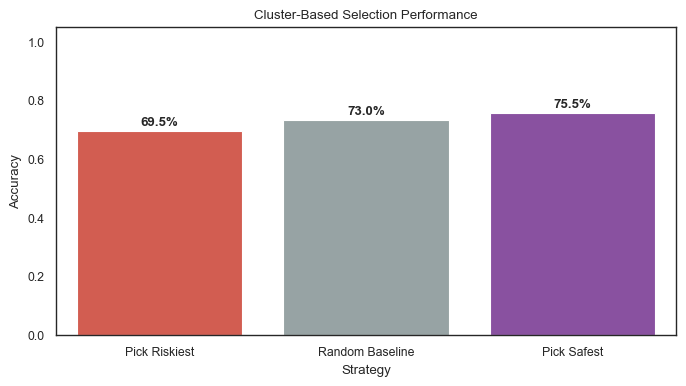

In [16]:
def analyze_intra_question_cluster_subset_with_examples(df):
    """
    Upgraded Analysis:
    1. Re-clusters data using subset features (Entropy, LogitGap, Mechanistic).
    2. Calculates 'Cluster_Safety_Score' dynamically.
    3. Prints FULL answer text and probabilities for every option.
    4. plots the performance comparison.
    """
    from sklearn.cluster import KMeans
    from sklearn.preprocessing import StandardScaler
    import seaborn as sns
    import matplotlib.pyplot as plt
    import pandas as pd
    import numpy as np
    from IPython.display import display, HTML

    # --- 1. RE-CLUSTER (Subset Features Only) ---
    subset_features = ['Entropy', 'LogitGap', 'Mechanistic']
    
    # Ensure features exist
    missing = [f for f in subset_features if f not in df.columns]
    if missing:
        print(f"⚠️ Cannot run: Missing features {missing}")
        return

    print(f"Re-clustering using subset: {subset_features}...")
    
    # Prepare Data
    X = df[subset_features].fillna(0)
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Adaptive K (same logic as original)
    n_clusters = min(12, len(df)//10) if len(df) > 50 else 3
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_scaled)
    
    # --- 2. CALCULATE CLUSTER "SAFETY" SCORES ---
    df['Temp_Cluster'] = labels
    cluster_accs = df.groupby('Temp_Cluster')['Correct'].mean()
    
    # Map the cluster's accuracy to the individual sample
    prob_col = 'Cluster_Safety_Score'
    df[prob_col] = df['Temp_Cluster'].map(cluster_accs)
    
    # --- 3. DETAILED INSPECTION LOOP ---
    # Identify questions with multiple answers
    group_col = 'question_id_external' if 'question_id_external' in df.columns else 'question_text'
    counts = df.groupby(group_col)[group_col].transform('count')
    sub_df = df[counts > 1].copy()
    
    if len(sub_df) == 0:
        print("⚠️ Not enough data: No questions have multiple answers.")
        return

    print(f"\nAnalyzing {len(sub_df[group_col].unique())} questions with multiple answers...")
    print("="*80)
    print("DETAILED ANSWER INSPECTION")
    print("="*80 + "\n")

    results = []
    
    # Loop through each question group
    for q_id, group in sub_df.groupby(group_col):
        if len(group) < 2: continue
        
        # Display Question
        q_text = group.iloc[0].get('question_text', f"ID: {q_id}")
        print(f"QUESTION: {q_text}")
        print("-" * 60)
        
        # Sort answers by their Safety Score (High to Low)
        sorted_group = group.sort_values(by=prob_col, ascending=False)
        
        for idx, row in sorted_group.iterrows():
            # Try to get full trace text, fallback to predicted answer if missing
            ans_text = row.get('full_trace_text', row.get('predicted_answer', "No text found"))
            score = row.get(prob_col, 0.0)
            is_correct = "✅" if row['Correct'] == 1 else "❌"
            
            print(f"Option [{is_correct}]:")
            print(f"   > Cluster Safety Score: {score:.1%}")
            print(f"   > Answer Text:\n{ans_text}\n")
            
        print("="*80 + "\n")

        # Collect Stats for Plotting
        id_best = group[prob_col].idxmax()
        id_worst = group[prob_col].idxmin()
        
        if group.loc[id_best, prob_col] == group.loc[id_worst, prob_col]:
            continue

        results.append({
            'Selected_Best_Correct': group.loc[id_best, 'Correct'],
            'Selected_Worst_Correct': group.loc[id_worst, 'Correct'],
            'Random_Baseline': group['Correct'].mean()
        })

    # --- 4. VISUALIZATION ---
    if not results:
        print("⚠️ Clusters did not differentiate answers within groups.")
        return

    res_df = pd.DataFrame(results)
    acc_best = res_df['Selected_Best_Correct'].mean()
    acc_worst = res_df['Selected_Worst_Correct'].mean()
    acc_base = res_df['Random_Baseline'].mean()
    
    delta = acc_best - acc_base
    color = "#27ae60" if delta > 0 else "#c0392b"
    
    # HTML Summary
    html = f"""
    <div style='border:1px solid #ddd; padding:15px; border-radius:8px; margin-bottom:20px; background:white'>
        <h3 style='margin-top:0; color:#2c3e50'>Cluster-Based Selection Performance</h3>
        <div style='display:flex; gap:20px; align-items:flex-end'>
            <div style='text-align:center'>
                <div style='font-size:2em; font-weight:bold; color:#7f8c8d'>{acc_base:.1%}</div>
                <div style='color:#7f8c8d; font-size:0.8em'>Random Baseline</div>
            </div>
            <div style='font-size:2em; color:#ccc'>→</div>
            <div style='text-align:center'>
                <div style='font-size:2em; font-weight:bold; color:#8e44ad'>{acc_best:.1%}</div>
                <div style='color:#8e44ad; font-weight:bold; font-size:0.8em'>Best Cluster Strategy</div>
            </div>
             <div style='font-size:2em; color:#ccc'>vs</div>
            <div style='text-align:center'>
                <div style='font-size:2em; font-weight:bold; color:#c0392b'>{acc_worst:.1%}</div>
                <div style='color:#c0392b; font-size:0.8em'>Worst Cluster Strategy</div>
            </div>
        </div>
        <div style='margin-top:10px; font-weight:bold; color:{color}; font-size:1.1em'>
            Gain over Random: {delta:+.1%}
        </div>
    </div>
    """
    display(HTML(html))

    # Bar Plot
    plt.figure(figsize=(8, 4))
    plot_data = pd.DataFrame({
        'Strategy': ['Pick Riskiest', 'Random Baseline', 'Pick Safest'],
        'Accuracy': [acc_worst, acc_base, acc_best]
    })
    ax = sns.barplot(x='Strategy', y='Accuracy', data=plot_data, palette=['#e74c3c', '#95a5a6', '#8e44ad'])
    plt.ylim(0, 1.05)
    for i, v in enumerate(plot_data['Accuracy']):
        ax.text(i, v + 0.02, f"{v:.1%}", ha='center', fontweight='bold')
    plt.title("Cluster-Based Selection Performance")
    plt.ylabel("Accuracy")
    plt.show()

# --- EXECUTE ---
analyze_intra_question_cluster_subset_with_examples(df)

In [19]:
# 🔎 Diagnose GPT override vs correctness (DB-backed)

import sqlite3
import pandas as pd

DB_PATH = "db/results.sqlite"  # must match DBManager

QUESTION_SUBSTR = "Natalia sold clips"

conn = sqlite3.connect(DB_PATH)

df = pd.read_sql_query(
    """
    SELECT
        question_text,
        predicted_answer,
        is_correct,
        eval_method,
        gpt_eval_reason,
        uq_avg_entropy,
        uq_mech_score,
        uq_heuristic_score
    FROM results
    WHERE question_text LIKE ?
    """,
    conn,
    params=(f"%{QUESTION_SUBSTR}%",)
)

conn.close()

# Display cleanly
pd.set_option("display.max_colwidth", 200)
display(df.sort_values(["is_correct", "uq_mech_score"], ascending=[False, False]))


,question_text,predicted_answer,is_correct,eval_method,gpt_eval_reason,uq_avg_entropy,uq_mech_score,uq_heuristic_score
0,"Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?",72,1,Local_MPS_LLM,The student correctly calculated the number of clips sold in May and then added that to the number sold in April to find the total.,0.071917,0.966309,0.407421
2,"Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?",72\nThe answer is: 72,1,Local_MPS_LLM,The student correctly calculated the number of clips Natalia sold in each month and then added the two amounts to find the total number of clips sold in April and May.,0.040688,0.962013,0.433654
3,"Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?",72,1,Local_MPS_LLM,"The student correctly calculated the number of clips sold in April and May, and then added those two numbers together to find the total.",0.026095,0.952680,0.474816
1,"Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?",72,1,Local_MPS_LLM,The student correctly calculated the number of clips sold in May and added it to the number sold in April to find the total.,0.030487,0.950987,0.482606
